## 1. Mines in Zambia. Data source: 
http://vlado.fmf.uni-lj.si/pub/networks/data/ucinet/kapmine.dat

BACKGROUND Bruce Kapferer (1969) collected data on men working on the surface in a mining operation in Zambia (then Northern Rhodesia). He wanted to account for the development and resolution of a conflict among the workers. The conflict centered on two men, Abraham and Donald; most workers ended up supporting Abraham.

Kapferer observed and recorded several types of interactions among the workers, including conversation, joking, job assistance, cash assistance and personal assistance. Unfortunately, he did not publish these data. Instead, the matrices indicate the workers joined only by uniplex ties (based on one relationship only, KAPFMU) or those joined by multiple-relation or multiplex ties (KAPFMM).

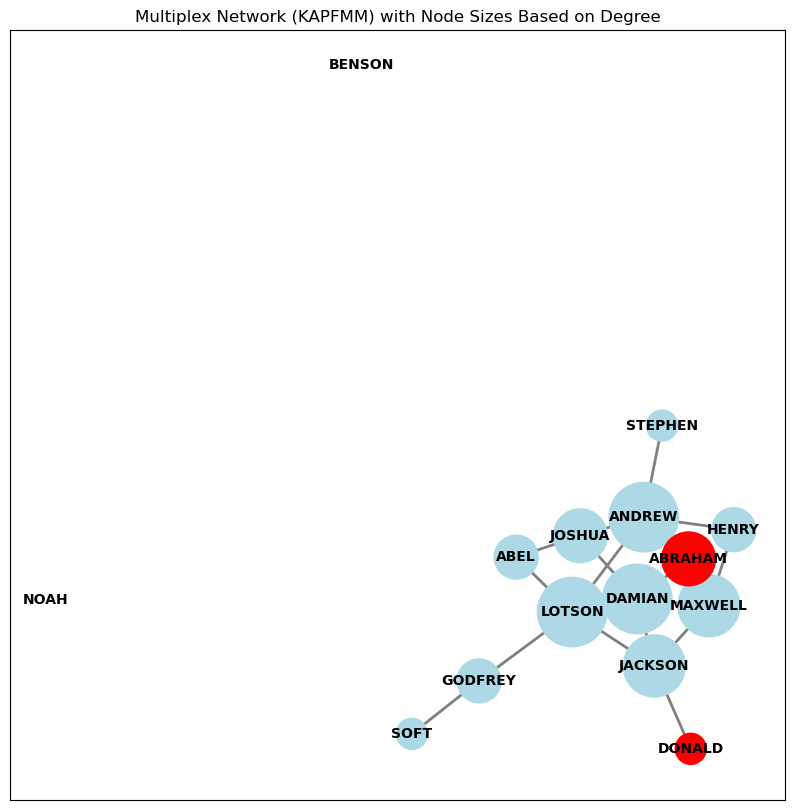

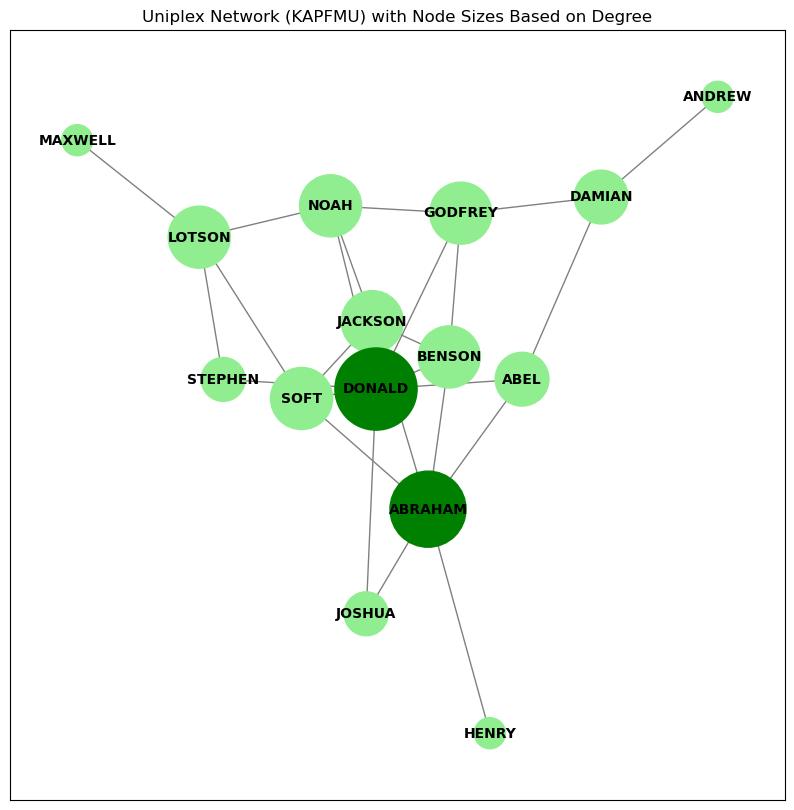

In [11]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt

# Load the data from the file (adjust this to your file path)
file_path = 'data/KAPFERER_MINE.dat'

# Reading the content of the file
with open(file_path, 'r') as file:
    content = file.read()

# Parse the file content to extract the relevant parts (row labels, column labels, and data)
lines = content.splitlines()

# Extract row labels
row_start = lines.index("ROW LABELS:") + 1
row_labels = lines[row_start:row_start + 15]

# Extract column labels (they are the same as row labels in this case)
col_start = lines.index("COLUMN LABELS:") + 1
col_labels = lines[col_start:col_start + 15]

# Extract the data matrix (starts after "DATA:")
data_start = lines.index("DATA:") + 1
matrix_data = [list(map(int, line.split())) for line in lines[data_start:data_start + 30]]

# There are two matrices (NM=2), so we'll reshape accordingly
matrix_data = np.array(matrix_data).reshape(2, 15, 15)

# Convert the first matrix (KAPFMM) into a Pandas DataFrame for better readability
df_matrix1 = pd.DataFrame(matrix_data[0], index=row_labels, columns=col_labels)

# Create the graphs from the matrices
G = nx.from_numpy_array(matrix_data[0])  # Multiplex (KAPFMM)
G2 = nx.from_numpy_array(matrix_data[1])  # Uniplex (KAPFMU)

# Relabel nodes with actual names for both graphs
G = nx.relabel_nodes(G, dict(enumerate(row_labels)))
G2 = nx.relabel_nodes(G2, dict(enumerate(row_labels)))

# For KAPFMM (Multiplex ties) visualization with Spring Layout
plt.figure(figsize=(10, 10))

# Calculate in-degree (number of edges connected to a node)
in_degrees = dict(G.degree())

# Define node sizes based on in-degree
node_colors = ['red' if node in ['ABRAHAM', 'DONALD'] else 'lightblue' for node in G.nodes()]
node_sizes = [in_degrees[node] * 500 for node in G.nodes()]  # Larger for higher degree nodes

# Use spring layout
pos = nx.spring_layout(G)

# Draw the graph with the spring layout
nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes)
nx.draw_networkx_labels(G, pos, font_size=10, font_weight='bold')
nx.draw_networkx_edges(G, pos, width=2, edge_color='gray')

plt.title("Multiplex Network (KAPFMM) with Node Sizes Based on Degree")
plt.show()

# For KAPFMU (Uniplex ties) visualization with Spring Layout
plt.figure(figsize=(10, 10))

# Calculate in-degree for KAPFMU
in_degrees2 = dict(G2.degree())

# Define node sizes based on in-degree
node_colors2 = ['green' if node in ['ABRAHAM', 'DONALD'] else 'lightgreen' for node in G2.nodes()]
node_sizes2 = [in_degrees2[node] * 500 for node in G2.nodes()]  # Larger for higher degree nodes

# Use spring layout
pos2 = nx.spring_layout(G2)

# Draw the graph with the spring layout
nx.draw_networkx_nodes(G2, pos2, node_color=node_colors2, node_size=node_sizes2)
nx.draw_networkx_labels(G2, pos2, font_size=10, font_weight='bold')
nx.draw_networkx_edges(G2, pos2, width=1, edge_color='gray')

plt.title("Uniplex Network (KAPFMU) with Node Sizes Based on Degree")
plt.show()


## 2. Football national teams export players to other countries

Our network example describes the 22 soccer teams which participated in the World Championship in Paris, 1998.

Players of the national team often have contracts in other countries. This constitutes a players market where national teams export players to other countries. Members of the 22 teams had contracts in altogether 35 countries.

Counting which team exports how many players to which country can be described with a valued, asymmetric graph. The graph is highly unsymmetric: some countries only export players, some countries are only importers.

Source: http://vlado.fmf.uni-lj.si/pub/networks/data/sport/football.htm

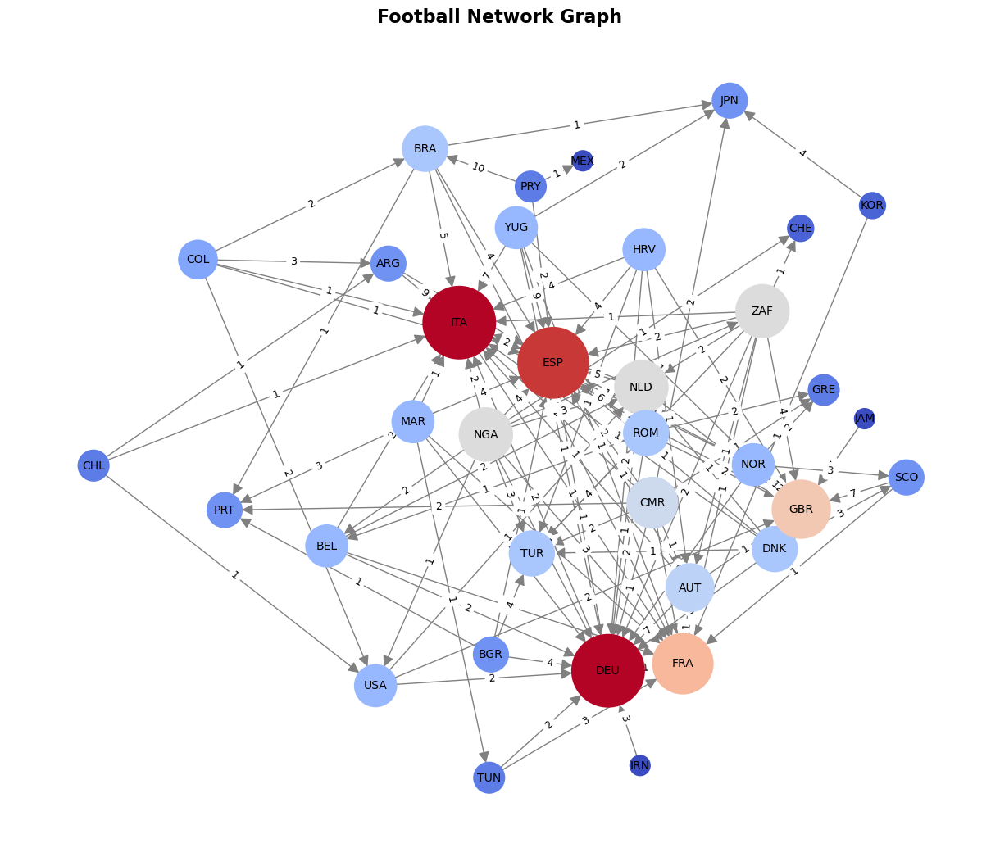

In [26]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

def read_net_file(filepath):
    """
    Reads a .net file and constructs a directed graph using NetworkX.
    The file must contain *Vertices and *Arcs sections for nodes and edges.
    """
    G = nx.DiGraph()  # Initialize a directed graph
    vertices_section = False  # Tracks if we are in the vertices section
    arcs_section = False  # Tracks if we are in the arcs section
    
    with open(filepath, 'r') as file:
        for line in file:
            line = line.strip()

            # Detect sections in the .net file
            if "*Vertices" in line:
                vertices_section = True
                arcs_section = False
                continue
            elif "*Arcs" in line:
                vertices_section = False
                arcs_section = True
                continue

            # Process vertices (nodes)
            if vertices_section:
                parts = line.split()
                if len(parts) >= 4:
                    node_id = int(parts[0])
                    label = parts[1].strip('"')  # Remove quotes around the label
                    x, y = float(parts[2]), float(parts[3])  # Coordinates
                    G.add_node(node_id, label=label, x=x, y=y)  # Add node with attributes

            # Process arcs (edges)
            if arcs_section:
                parts = line.split()
                if len(parts) == 3:
                    source = int(parts[0])  # Start of the edge
                    target = int(parts[1])  # End of the edge
                    weight = int(parts[2])  # Weight of the edge
                    G.add_edge(source, target, weight=weight)  # Add edge with weight
    
    return G

def draw_graph(G):
    """
    Draws the directed graph with positions based on node attributes,
    node size based on degree, and edge labels to display weights.
    """
    # Extract node positions from the node attributes
    positions = {node: (G.nodes[node]['x'], G.nodes[node]['y']) for node in G.nodes()}

    # Calculate node degrees to adjust node sizes
    degrees = np.array([deg for node, deg in G.degree()])

    # Normalize node sizes between a minimum and maximum size
    min_size = 300
    max_size = 4000
    node_sizes = min_size + (degrees - degrees.min()) / (degrees.max() - degrees.min()) * (max_size - min_size)
    
    # Create a colormap for node degrees
    node_color_map = degrees

    plt.figure(figsize=(12, 10))  # Set the figure size

    # Draw the graph
    nx.draw(G, pos=positions, 
            with_labels=True, 
            labels=nx.get_node_attributes(G, 'label'), 
            node_size=node_sizes, 
            node_color=node_color_map, cmap=plt.cm.coolwarm,  # Use color map based on degree
            font_size=10, font_color='black', 
            edge_color='gray', arrows=True, 
            arrowstyle='-|>', arrowsize=20,  # Arrow style and size for edges
            linewidths=1.5)

    # Add edge labels (weights)
    edge_labels = nx.get_edge_attributes(G, 'weight')
    nx.draw_networkx_edge_labels(G, pos=positions, edge_labels=edge_labels, font_size=9)

    plt.title('Football Network Graph', fontsize=16, fontweight='bold')  # Add a title
    plt.show()

# Example usage:
filepath = 'data/football.net'  # Replace with your actual .net file path
G = read_net_file(filepath)
draw_graph(G)


## A Song of Ice and Fire , first book
Source: https://github.com/mathbeveridge/asoiaf

In [1]:
def prepare_data(nodes_path, edges_path):
    nodes = pd.read_csv(nodes_path)
    edges = pd.read_csv(edges_path)
    nodes['Name']  = nodes['Label'].str.split(' ').str[0]
    return nodes, edges


def create_graph(nodes, edges):
    G = nx.Graph()
    for _, node in nodes.iterrows():
        G.add_node(node['Id'], label=node['Name'], color=node['color'])
    for _, edge in edges.iterrows():
        G.add_edge(edge['Source'], edge['Target'], weight=edge['Weight'])
    return G


In [2]:
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

def add_colors_for_biggest_houses(nodes, threshold=3):
    # Use a colormap from matplotlib instead of custom defined colors
    cmap = get_cmap('tab20')  # Choose a colormap (you can change this to others like 'viridis', 'plasma', etc.)

    # Extract houses from the 'Label' column (last word)
    houses = [nodes['Label'][i].split()[-1] for i in range(len(nodes))]

    # Get unique houses
    unique_houses = list(set(houses))

    # Count how many times each house appears
    house_count = {h: houses.count(h) for h in unique_houses if houses.count(h) >= threshold}

    # Get different color for each house using the colormap
    colors = [cmap(i / len(house_count)) for i in range(len(house_count))]

    # Create a color map
    color_map = dict(zip(house_count.keys(), colors))

    # Assign colors to each node
    nodes['color'] = [color_map[h] if h in house_count.keys() else 'grey' for h in houses]

    return nodes, color_map

def prepare_data(nodes_path, edges_path):
    nodes = pd.read_csv(nodes_path)
    edges = pd.read_csv(edges_path)
    nodes['Name'] = nodes['Label'].str.split(' ').str[0]
    return nodes, edges

def create_graph(nodes, edges):
    G = nx.Graph()
    for _, node in nodes.iterrows():
        G.add_node(node['Id'], label=node['Name'], color=node['color'])
    for _, edge in edges.iterrows():
        G.add_edge(edge['Source'], edge['Target'], weight=edge['weight'])
    return G

def create_node_network(nodes_path, edges_path, threshold, k):
    nodes, edges = prepare_data(nodes_path, edges_path)
    nodes, color_map = add_colors_for_biggest_houses(nodes, threshold)
    G = create_graph(nodes, edges)

    node_degrees = dict(G.degree(weight='weight'))

    # Increase the figure size
    plt.figure(figsize=(20, 20))

    # Position the nodes using a layout algorithm
    pos = nx.spring_layout(G, k=k)

    # Draw the edges
    nx.draw_networkx_edges(G, pos, alpha=0.2)

    # Draw nodes with sizes proportional to node degree
    node_sizes = [10 * node_degrees[node] for node in G.nodes]
    node_colors = [G.nodes[node]['color'] for node in G.nodes]
    nx.draw_networkx_nodes(G, pos, node_size=node_sizes, node_color=node_colors, alpha=0.8)

    # Draw labels with fixed size and the node color
    for node, (x, y) in pos.items():
        label = nodes[nodes['Id'] == node]['Name'].values[0]
        plt.text(x, y, label, size=10, color='black', ha='center', va='center')

    # Show the graph with nodes, small labels, and legend
    legend_handles = [plt.Line2D([0], [0], marker='o', markersize=10, label=label, color=color)
                  for label, color in color_map.items()]
    plt.legend(handles=legend_handles, title='Houses', loc='upper left', bbox_to_anchor=(1, 1))

    plt.axis('off')
    plt.show()

def create_label_network(nodes_path, edges_path, threshold, k):
    nodes, edges = prepare_data(nodes_path, edges_path)
    nodes, color_map = add_colors_for_biggest_houses(nodes, threshold)
    G = create_graph(nodes, edges)

    # Create a dictionary of node degrees
    node_degrees = dict(G.degree(weight='weight'))

    # Increase the figure size
    plt.figure(figsize=(20, 20))

    # Position the nodes using a layout algorithm
    pos = nx.spring_layout(G, k=k)

    # edge size is proportional to the weight of the edge
    edge_sizes = [0.1 * G[u][v]['weight'] for u, v in G.edges]

    # Draw the edges
    nx.draw_networkx_edges(G, pos, alpha=0.2, width=edge_sizes)
    nx.draw_networkx_nodes(G,  pos, node_size=0, alpha=0)

    # Draw labels with sizes proportional to node degree
    for node, (x, y) in pos.items():
        # Make label as name of the node
        label = nodes[nodes['Id'] == node]['Name'].values[0]
        label_size = node_degrees[node] * 1 / 10
        # Color the text to the color of the node it represents
        plt.text(x, y, label, size=label_size, color=G.nodes[node]['color'], ha='center', va='center')

    # Show the graph without nodes
    plt.legend(handles=[plt.Line2D([0], [0], marker='o', color=color_map[h], label=h) for h in color_map.keys()],
           loc='upper left', bbox_to_anchor=(1, 1))
    plt.axis('off')
    plt.show()

C:\Users\Filip\AppData\Local\Temp\ipykernel_19552\3954017246.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('tab20')  # Choose a colormap (you can change this to others like 'viridis', 'plasma', etc.)


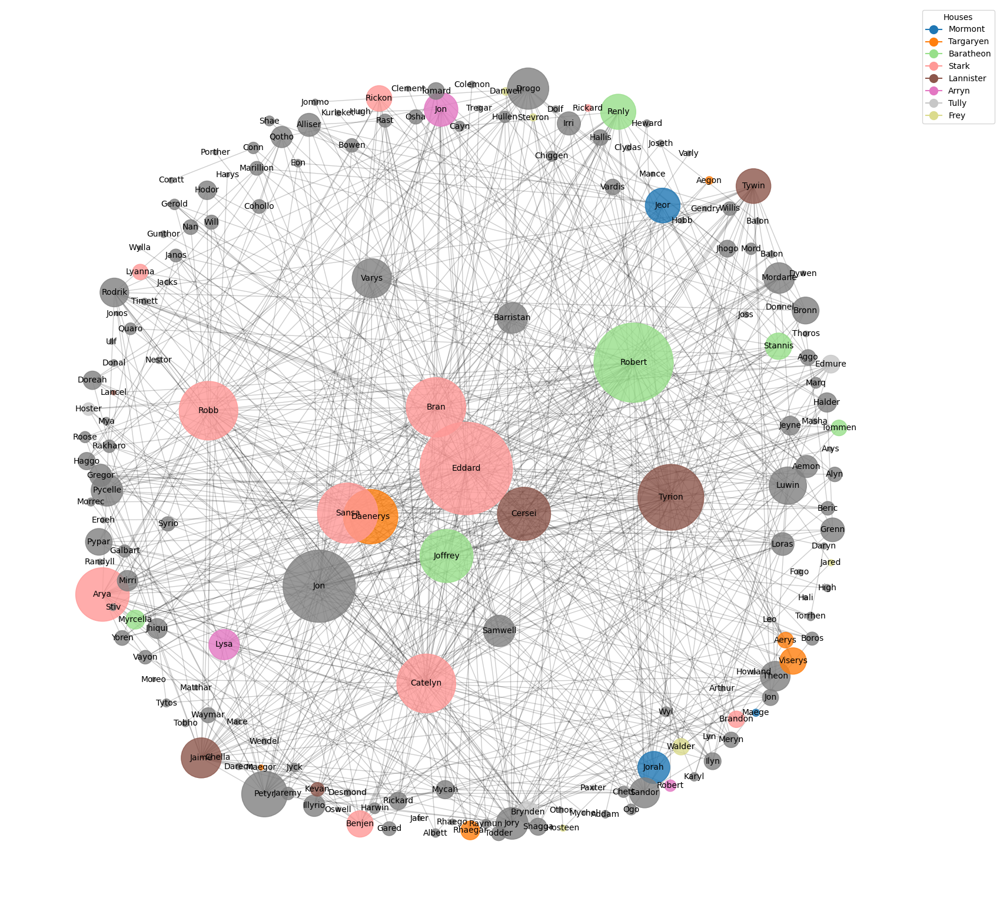

C:\Users\Filip\AppData\Local\Temp\ipykernel_19552\3954017246.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('tab20')  # Choose a colormap (you can change this to others like 'viridis', 'plasma', etc.)


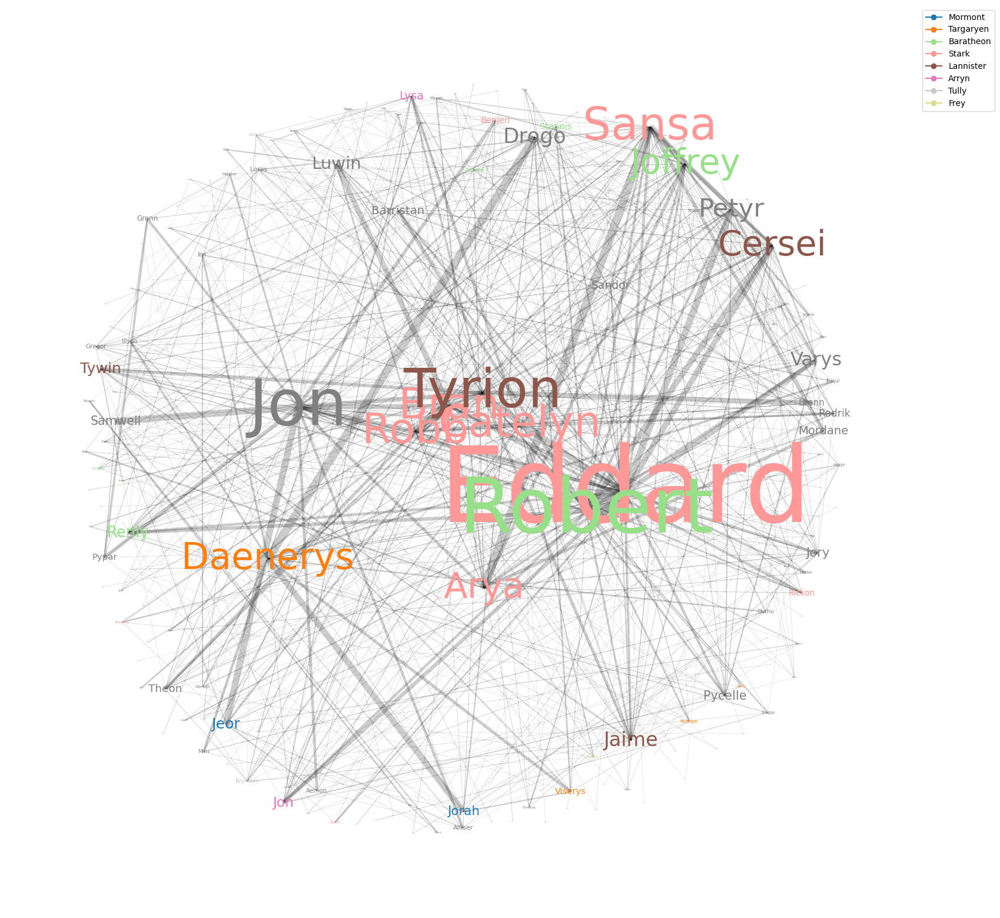

In [3]:
create_node_network('data/asoiaf-book1-nodes.csv', 'data/asoiaf-book1-edges.csv', 3, 4.5)
create_label_network('data/asoiaf-book1-nodes.csv', 'data/asoiaf-book1-edges.csv', 3, 4.5)

C:\Users\Filip\AppData\Local\Temp\ipykernel_28848\2420320181.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('tab20')  # Choose a colormap (you can change this to others like 'viridis', 'plasma', etc.)


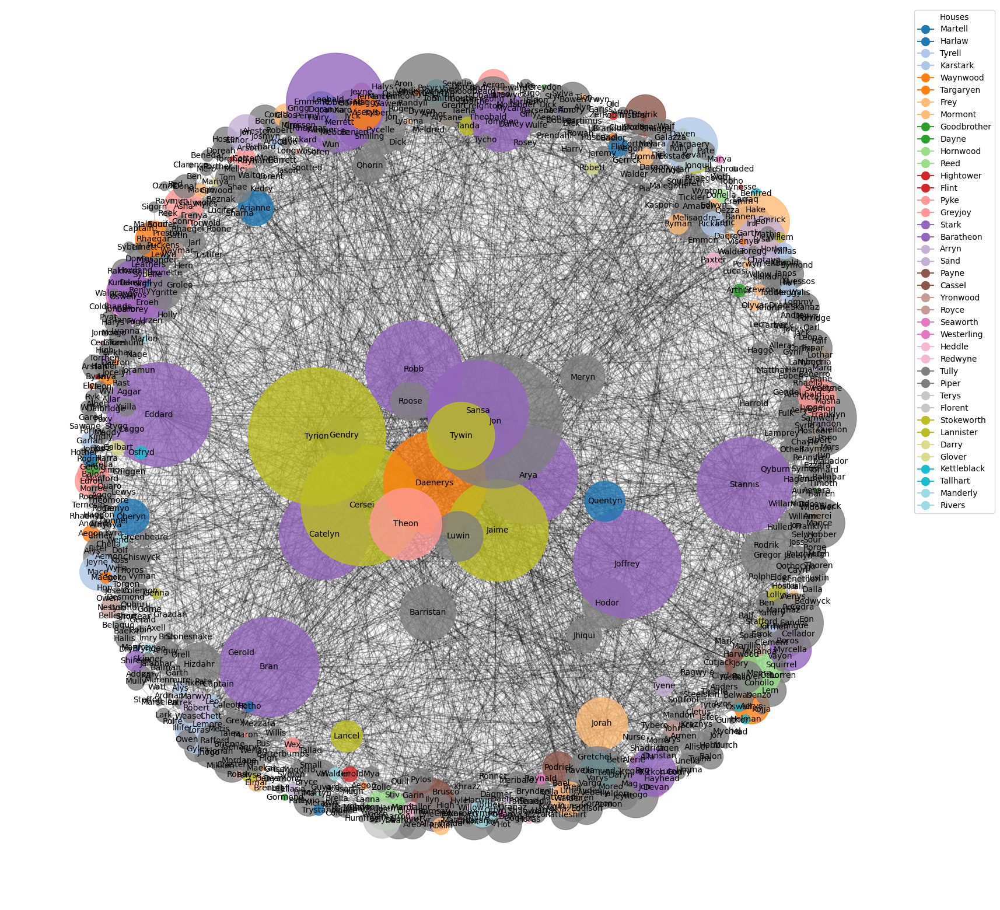

C:\Users\Filip\AppData\Local\Temp\ipykernel_28848\2420320181.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap('tab20')  # Choose a colormap (you can change this to others like 'viridis', 'plasma', etc.)


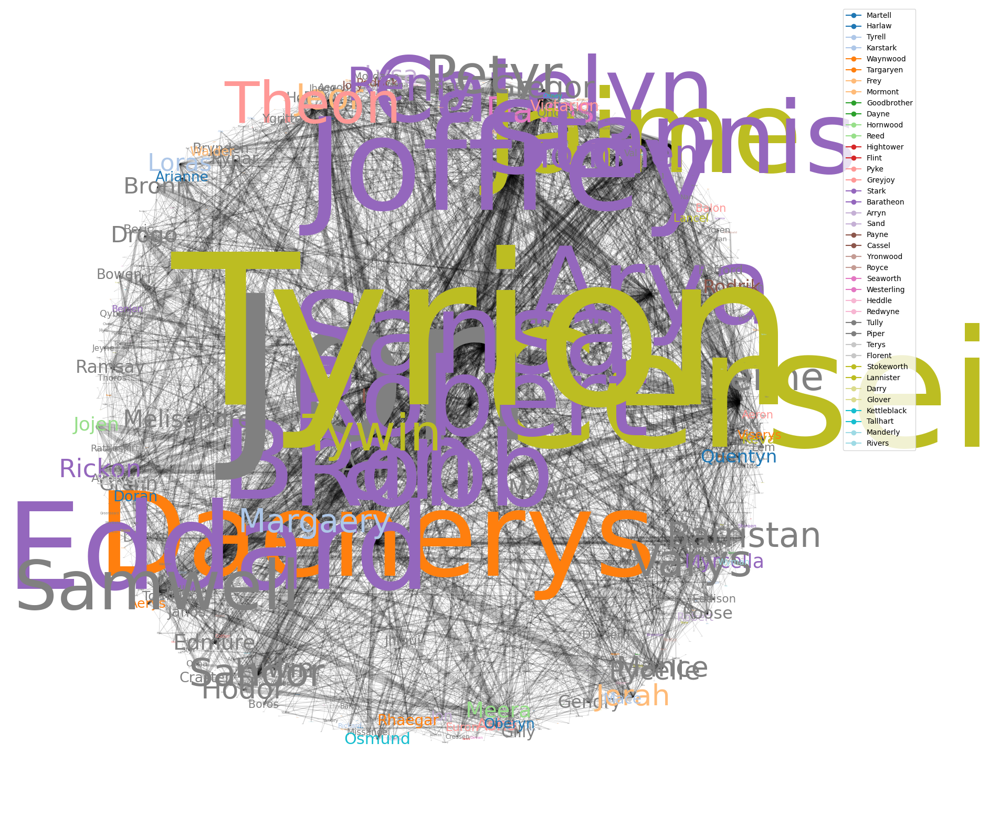

In [78]:
create_node_network('data/asoiaf-all-nodes.csv', 'data/asoiaf-all-edges.csv', 3, 4.5)
create_label_network('data/asoiaf-all-nodes.csv', 'data/asoiaf-all-edges.csv', 3, 4.5)

## 4. Star Wars occurence in scenes:
https://evelinag.com/blog/2015/12-15-star-wars-social-network/


In [79]:
nodes = pd.read_csv('data/starwars-characters.csv')
edges = pd.read_csv('data/starwars-links.csv')

G = nx.Graph()

for _, node in nodes.iterrows():
    G.add_node(node['number'], label=node['name'])

for _, edge in edges.iterrows():
    G.add_edge(edge['character1'], edge['character2'], weight=edge['scenes'])

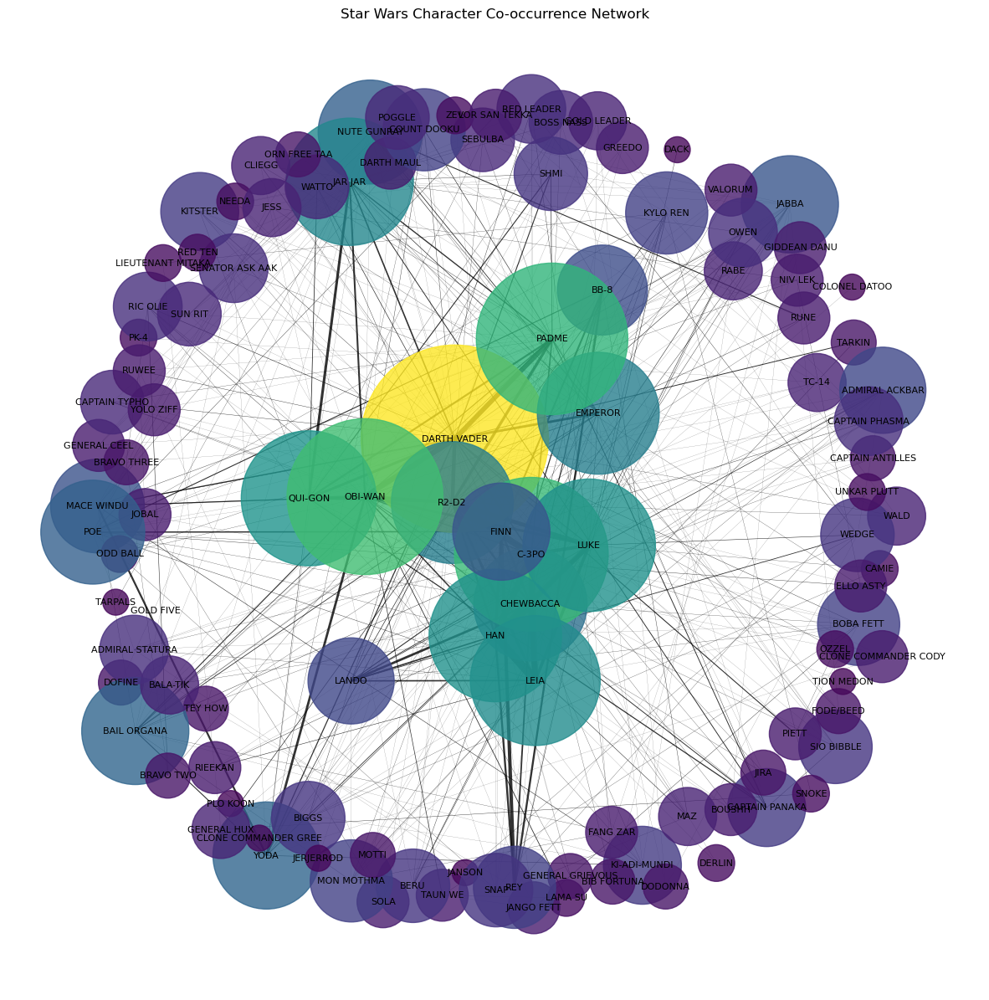

In [92]:
node_degrees = dict(G.degree(weight='scenes'))

plt.figure(figsize=(15, 15))

# Position the nodes using a layout algorithm
pos = nx.spring_layout(G, k= 3)

# Draw nodes with sizes proportional to node degree
node_sizes = [500 * node_degrees[node] for node in G.nodes]
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, alpha=0.8, node_color=node_sizes)
# Width of edges is proportional to the weight of the edges
edge_sizes = [0.1 * G[u][v]['weight'] for u, v in G.edges]
nx.draw_networkx_edges(G, pos, width=edge_sizes, alpha=0.8)
# Draw labels with fixed size and the node color
for node, (x, y) in pos.items():
    label = nodes[nodes['number'] == node]['name'].values[0]
    plt.text(x, y, label, size=8, color='black', ha='center', va='center')

plt.title('Star Wars Character Co-occurrence Network')
plt.axis('off')
plt.show()


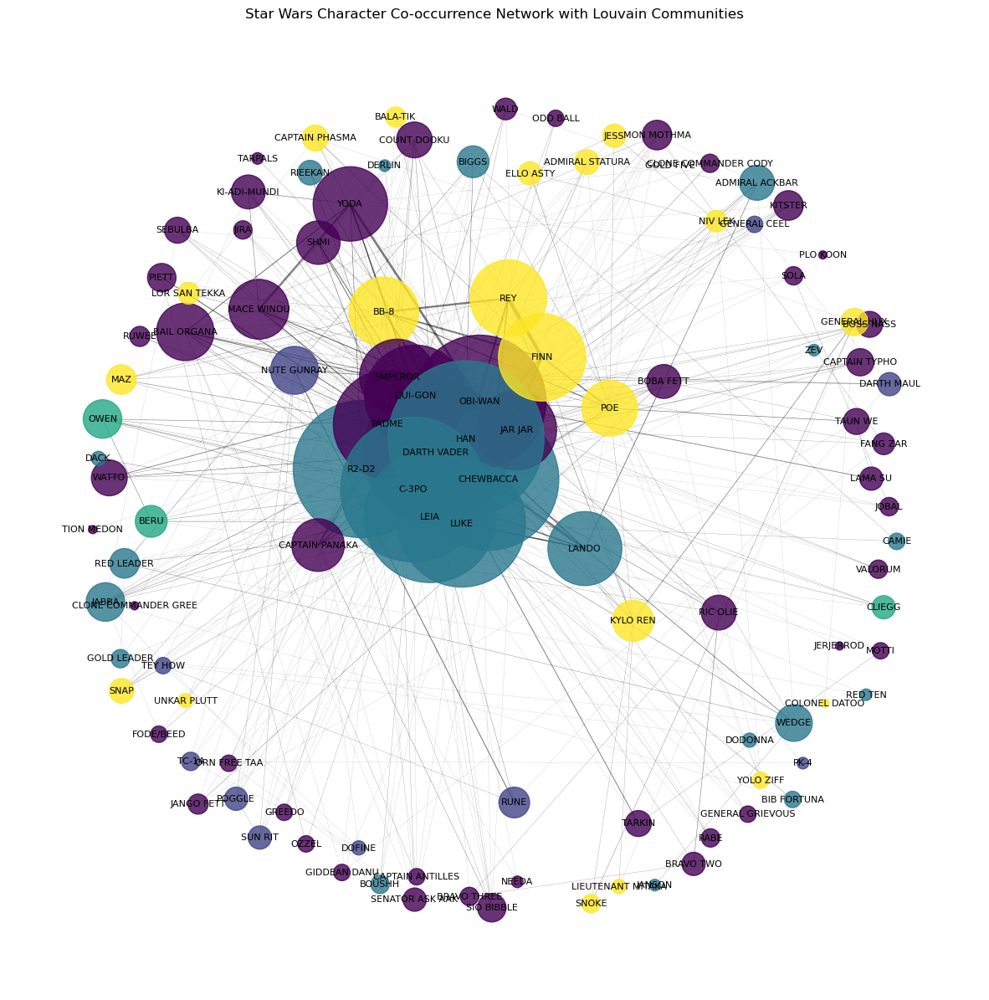

In [95]:
import networkx as nx
import matplotlib.pyplot as plt
from networkx.algorithms.community import louvain_communities

# Build the graph from the user-provided edges and nodes
G = nx.Graph()

# Assuming the 'nodes' and 'edges' dataframes are already loaded with character and scene details.
# Add nodes with names and degrees from node data
for _, node in nodes.iterrows():
    G.add_node(node['number'], label=node['name'])

# Add edges with weights (based on co-occurrence scenes)
for _, edge in edges.iterrows():
    G.add_edge(edge['character1'], edge['character2'], weight=edge['scenes'])

# Apply Louvain method to detect communities
communities = louvain_communities(G, weight='weight')

# Assign colors to nodes based on their community
community_map = {}
for i, community in enumerate(communities):
    for node in community:
        community_map[node] = i

# Node sizes based on degree
node_degrees = dict(G.degree(weight='weight'))
node_sizes = [50 * node_degrees[node] for node in G.nodes]

# Position the nodes using a layout algorithm
pos = nx.spring_layout(G, k=2, seed=42)

# Draw the network graph
plt.figure(figsize=(15, 15))

# Draw nodes, with color based on community
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, cmap=plt.cm.viridis,
                       node_color=[community_map[node] for node in G.nodes], alpha=0.8)

# Width of edges is proportional to the weight of the edges
edge_sizes = [0.1 * G[u][v]['weight'] for u, v in G.edges]
nx.draw_networkx_edges(G, pos, width=edge_sizes, alpha=0.5)

# Draw labels
for node, (x, y) in pos.items():
    label = nodes[nodes['number'] == node]['name'].values[0]
    plt.text(x, y, label, size=8, color='black', ha='center', va='center')

plt.title('Star Wars Character Co-occurrence Network with Louvain Communities')
plt.axis('off')
plt.show()


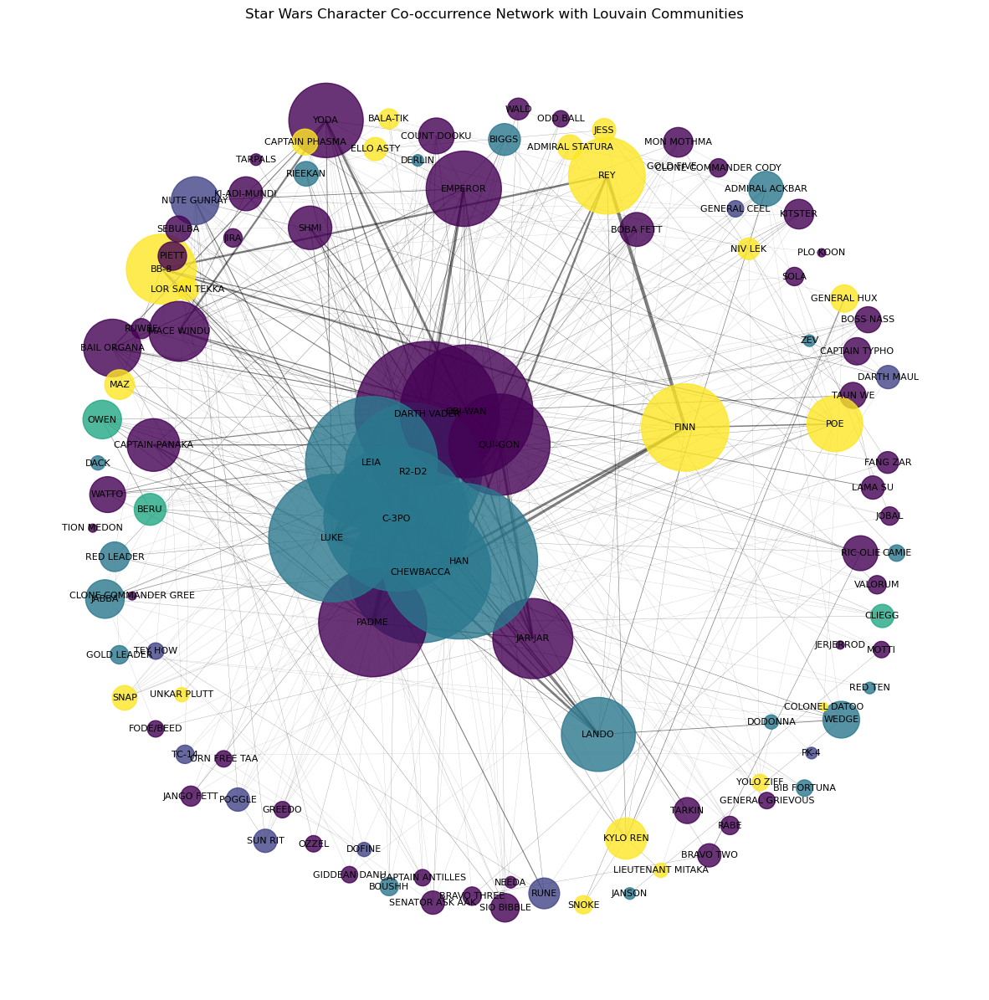

In [96]:
pos = nx.spring_layout(G, k=3, seed=42)

# Draw the network graph
plt.figure(figsize=(15, 15))

# Draw nodes, with color based on community
nx.draw_networkx_nodes(G, pos, node_size=node_sizes, cmap=plt.cm.viridis,
                       node_color=[community_map[node] for node in G.nodes], alpha=0.8)

edge_sizes = [0.1 * G[u][v]['weight'] for u, v in G.edges]
nx.draw_networkx_edges(G, pos, width=edge_sizes, alpha=0.5)

# Draw labels with less overlap by adjusting label positioning if necessary
for node, (x, y) in pos.items():
    label = nodes[nodes['number'] == node]['name'].values[0]
    plt.text(x, y, label, size=8, color='black', ha='center', va='center')

plt.title('Star Wars Character Co-occurrence Network with Louvain Communities')
plt.axis('off')
plt.show()
